#DBDP assignment 3
###Authors:
- Trinh Hung Nam - 464560
- Linh Hoang - 467424

###Import needed package

In [0]:
import os

# from pyspark import SparkContext
# from pyspark import SparkConf
from pyspark.sql.types import StructType
from pyspark.sql.types import StructField
from pyspark.sql.types import StringType
from pyspark.sql.types import DoubleType
from pyspark.sql.functions import when, lit, concat
from pyspark.sql import functions as F
from pyspark.sql.types import IntegerType
from pyspark.sql import Row
from pyspark.sql import SparkSession


###Create a spark SQL Dataframe
- Extract the collumns information from the text file RDD to create a schema
- Read the file again using csv format with the extracted schema

In [0]:
schema = StructType()

rddFromFile = spark.sparkContext.textFile("dbfs:/FileStore/shared_uploads/464560@student.saxion.nl/atussum.csv")

# list of columns
for col in rddFromFile.take(1)[0].split(','):
  if col == 'tucaseid':
    schema.add(StructField(col, StringType(), False))
  else:
    schema.add(StructField(col, DoubleType(), False))

    
df = spark.read.format("csv").option("header","true").schema(schema).load("dbfs:/FileStore/shared_uploads/464560@student.saxion.nl/atussum.csv")
df.collect()


Out[2]: [Row(tucaseid='20030100013280', gemetsta=1.0, gtmetsta=-1.0, peeduca=44.0, pehspnon=2.0, ptdtrace=2.0, teage=60.0, telfs=2.0, temjot=2.0, teschenr=-1.0, teschlvl=-1.0, tesex=1.0, tespempnot=2.0, trchildnum=0.0, trdpftpt=2.0, trernwa=66000.0, trholiday=0.0, trspftpt=-1.0, trsppres=1.0, tryhhchild=-1.0, tudiaryday=6.0, tufnwgtp=8155463.0, tehruslt=30.0, tuyear=2003.0, t010101=870.0, t010102=0.0, t010199=0.0, t010201=40.0, t010299=0.0, t010301=0.0, t010399=0.0, t010401=0.0, t010499=0.0, t010501=0.0, t010599=0.0, t019999=0.0, t020101=0.0, t020102=0.0, t020103=0.0, t020104=0.0, t020199=0.0, t020201=0.0, t020202=0.0, t020203=0.0, t020299=0.0, t020301=0.0, t020302=0.0, t020303=0.0, t020399=0.0, t020401=0.0, t020402=0.0, t020499=0.0, t020501=0.0, t020502=0.0, t020599=0.0, t020681=0.0, t020699=0.0, t020701=0.0, t020799=0.0, t020801=0.0, t020899=0.0, t020901=0.0, t020902=0.0, t020903=0.0, t020904=0.0, t020905=0.0, t020999=0.0, t029999=0.0, t030101=0.0, t030102=0.0, t030103=0.0, t030104=0

###The data frame schema info

In [0]:
df.printSchema()

root
 |-- tucaseid: string (nullable = true)
 |-- gemetsta: double (nullable = true)
 |-- gtmetsta: double (nullable = true)
 |-- peeduca: double (nullable = true)
 |-- pehspnon: double (nullable = true)
 |-- ptdtrace: double (nullable = true)
 |-- teage: double (nullable = true)
 |-- telfs: double (nullable = true)
 |-- temjot: double (nullable = true)
 |-- teschenr: double (nullable = true)
 |-- teschlvl: double (nullable = true)
 |-- tesex: double (nullable = true)
 |-- tespempnot: double (nullable = true)
 |-- trchildnum: double (nullable = true)
 |-- trdpftpt: double (nullable = true)
 |-- trernwa: double (nullable = true)
 |-- trholiday: double (nullable = true)
 |-- trspftpt: double (nullable = true)
 |-- trsppres: double (nullable = true)
 |-- tryhhchild: double (nullable = true)
 |-- tudiaryday: double (nullable = true)
 |-- tufnwgtp: double (nullable = true)
 |-- tehruslt: double (nullable = true)
 |-- tuyear: double (nullable = true)
 |-- t010101: double (nullable = true)
 |

##How much time do the respondents spend on primary needs compared to other activities?
- Filter columns name belong to these 2 main categories (primary_needs_time and leisure_time)
- Sum all the columns belong to the primary_needs activies of each person and write it to a new column(primary_needs_time)
- Sum all the columns belong to the leisure activies of each person and write it to a new column(other_activities_time)
- Get the total of primary_needs_time and other_activities_time for a person
- Show the average of primary_needs_time and other_activities_time for a person <br/>
<b>Conclusion:</b> the respondents spend more than nearly 90 min on primary_needs activities than to other leisure activites

In [0]:
needs_matches = ['t01' , 't03' , 't11' , 't1801' , 't1803']
other_matches = ['t02' , 't04' , 't06' , 't07' , 't08', 't09', 't10' , 't12' , 't13' , 't14' , 't15' , 't16' , 't18']

primary_needs_columns = [col for col in df.columns if any(x in col for x in needs_matches)]
other_activities_columns = [col for col in df.columns if any(x in col for x in other_matches)]

newDF = df.select(['tucaseid']+primary_needs_columns+other_activities_columns).withColumn('primary_needs_time',sum(df[col] for col in primary_needs_columns)).withColumn('other_activities_time',sum(df[col] for col in other_activities_columns))
primary_other_DF = newDF.select(['tucaseid','primary_needs_time','other_activities_time'])
primary_other_DF.groupBy().avg().show()


+-----------------------+--------------------------+
|avg(primary_needs_time)|avg(other_activities_time)|
+-----------------------+--------------------------+
|      681.4101918731927|         592.8231523864155|
+-----------------------+--------------------------+



##Do women and men spend the same amount of time in working?
- Filter columns name belong to a main category (work_time)
- Sum all the columns belong to the work activies of each person and write it to a new column(work_time)
- Get the total work_time for a person 
- Group the total work_time by sex and show the average working time of male and female <br/>
<b>Conclusion:</b> the male respondents spend more than nearly 73 min on work compared to the female

In [0]:
work_matches = ['t05' , 't1805']
work_columns = [col for col in df.columns if any(x in col for x in work_matches)]
newDF = df.select(['tesex']+work_columns).withColumn('work_time',sum(df[col] for col in work_columns))
work_DF = newDF.select(['tesex','work_time'])
work_DF.groupBy("tesex").avg('work_time').show()

+-----+-----------------+
|tesex|   avg(work_time)|
+-----+-----------------+
|  1.0|214.3454939933304|
|  2.0|140.4197868468937|
+-----+-----------------+



##Does the time spent on primary needs change when people get older?
- Filter columns name belong to a main category (primary_needs_time)
- Sum all the columns belong to the primary_needs activies of each person and write it to a new column (primary_needs_time)
- Get the age of each person and label them (young, active, elder) and write these label to a new column (age_label)
- Get the total primary_needs_time of each person, group them by age_label and show the average primary_needs_time for each label <br/>
<b>Conclusion:</b> Base on the results from the respondents, the older you are, the less time you will spend primary_needs

In [0]:
needs_matches = ['t01' , 't03' , 't11' , 't1801' , 't1803']
primary_needs_columns = [col for col in df.columns if any(x in col for x in needs_matches)]
newDF = df.select(['tucaseid','teage']+primary_needs_columns).withColumn('primary_needs_time',sum(df[col] for col in primary_needs_columns))
age_label_DF = newDF.select(['tucaseid','primary_needs_time','teage']).withColumn("age_label", when(F.col('teage') <22, lit('young')).when(F.col('teage')>55, lit('elder')).otherwise(lit('active')))
age_label_DF.select(['age_label','primary_needs_time']).groupBy('age_label').avg('primary_needs_time').show()


+---------+-----------------------+
|age_label|avg(primary_needs_time)|
+---------+-----------------------+
|   active|      689.3074325310703|
|    young|      698.7807147076196|
|    elder|      662.2209470731663|
+---------+-----------------------+



##How much time do employed people spend on leisure compared to unemployed people?
- Filter columns name belong to a main category (other_activities_time)
- Sum all the columns belong to the other_activities activies of each person and write it to a new column (other_activities_time)
- Get the labor status of each person and label them (Not in labor force, unemployed, employed) and write these label to a new column (labor_label)
- Get the total other_activities_time of each person, group them by labor_label and show the average other_activities_time for each label <br/>
<b>Conclusion:</b><br/>
- If the ones who are not in labor force are considered as unemployed, the unemployed people spend more than nearly 194min on leisure time compared to employed ones 
- If the ones who are not in labor force are not considered as unemployed, the unemployed people spend more than nearly 172min on leisure time compared to employed ones

In [0]:
other_matches = ['t02' , 't04' , 't06' , 't07' , 't08', 't09', 't10' , 't12' , 't13' , 't14' , 't15' , 't16' , 't18']
other_activities_columns = [col for col in df.columns if any(x in col for x in other_matches)]
newDF = df.select(['tucaseid', 'telfs']+other_activities_columns).withColumn('other_activities_time',sum(df[col] for col in other_activities_columns))
labor_label_DF = newDF.select(['tucaseid','other_activities_time','telfs']).withColumn("labor_label", when(F.col("telfs") == 1, lit("employed")).when(F.col("telfs") == 2, lit("employed")).when(F.col("telfs") == 3, lit("unemployed")).when(F.col("telfs") == 4, lit("unemployed")).otherwise(lit("Not in labor force")))
labor_label_DF.select(['labor_label','other_activities_time']).groupBy("labor_label").avg("other_activities_time").show()

+------------------+--------------------------+
|       labor_label|avg(other_activities_time)|
+------------------+--------------------------+
|Not in labor force|          717.179568448384|
|        unemployed|         691.6149253731344|
|          employed|         519.9295173603947|
+------------------+--------------------------+



##Show in diagrams the average time spent (in hours) on each activity, for all the combinations of working status, sex and age.
- Filter columns name belong to 3 main category (primary_needs_time, work_time, other_activities_time)
- Sum all the columns for each of these 3 main category of each person and write it to a new column (primary_needs_time, work_time, other_activities_time)
- Get the age of each person and label them (young, active, elder) and write these label to a new column (age_label)
- Get the labor status of each person and label them (Not in labor force, unemployed, employed) and write these label to a new column (labor_label)
- Get the sex of each person and label them (female, male) and write these label to a new column (sex_label)
- Get the total (primary_needs_time, work_time, other_activities_time) of each person, group them by labor_label, age_label and sex_label and show the average (primary_needs_time, work_time, other_activities_time) for each label
- Combine labels for these 3 main category so it is easier to plot a diagram. A few example would be (young-employed-female, elder-employed-male, etc.)
- At the end, a dataframe contains the combined label together with the average of work_time, leisure_time, primary_needs_time is outputed
- We transformed it to a pandas' df and plot a bar diagram.s

+--------------------+--------------------+------------------+----------------------+
|               label|       avg_work_time|  avg_leisure_time|avg_primary_needs_time|
+--------------------+--------------------+------------------+----------------------+
|elder-Not in labo...| 0.04321423792319015|12.562158437040011|     11.18003211561622|
|young-employed-fe...|   3.154752089774419|  9.34758960265659|     11.59503607007901|
|elder-unemployed-...|  0.6667511261261261|12.454842342342342|    10.725056306306305|
|elder-employed-fe...|   3.911980306345733| 9.581047344340561|     10.61723857834361|
|elder-unemployed-...| 0.39184088269454126| 12.45801393728223|    10.937950058072008|
|active-Not in lab...| 0.07382594677449193| 10.82759190253442|    13.051942440339332|
|young-unemployed-...|  0.2173520561685055|11.265195586760282|     12.41198595787362|
|young-Not in labo...| 0.09026559454191034|12.085057261208577|    11.658315058479532|
|active-unemployed...|  0.4997967479674797|11.00894873

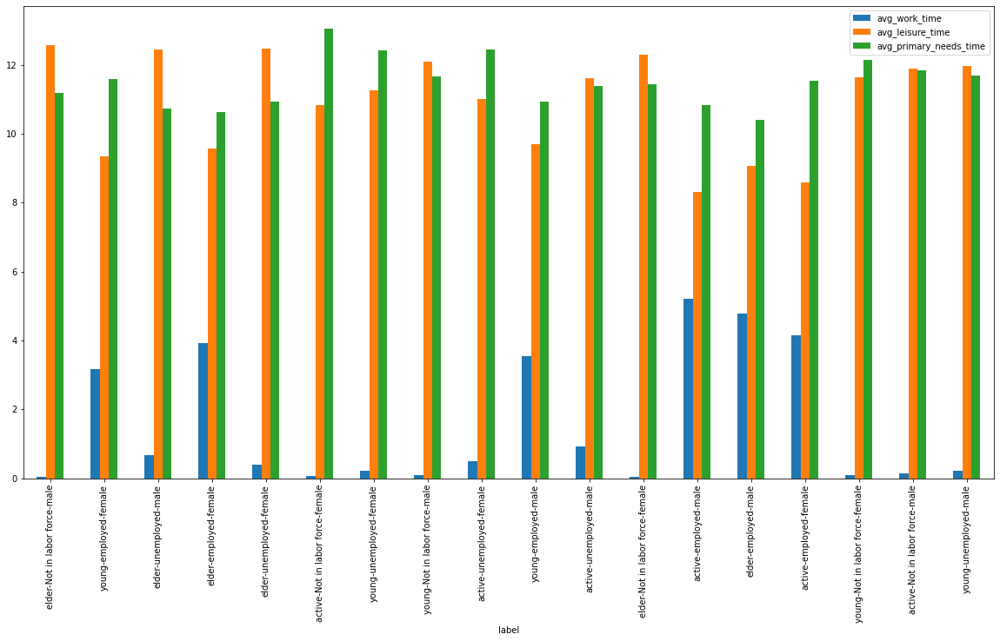

In [0]:
needs_matches = ['t01' , 't03' , 't11' , 't1801' , 't1803']
work_matches = ['t05' , 't1805']
other_matches = ['t02' , 't04' , 't06' , 't07' , 't08', 't09', 't10' , 't12' , 't13' , 't14' , 't15' , 't16' , 't18']
primary_needs_columns = [col for col in df.columns if any(x in col for x in needs_matches)]
work_columns = [col for col in df.columns if any(x in col for x in work_matches)]
other_activities_columns = [col for col in df.columns if any(x in col for x in other_matches)]
newDF = df.select(['tucaseid', 'telfs', 'teage', 'tesex']+primary_needs_columns+work_columns+other_activities_columns).withColumn('primary_needs_time',sum(df[col] for col in primary_needs_columns)).withColumn('work_time',sum(df[col] for col in work_columns)).withColumn('other_activities_time',sum(df[col] for col in other_activities_columns)).withColumn("labor_label", when(F.col("telfs") == 1, lit("employed")).when(F.col("telfs") == 2, lit("employed")).when(F.col("telfs") == 3, lit("unemployed")).when(F.col("telfs") == 4, lit("unemployed")).otherwise(lit("Not in labor force"))).withColumn("age_label", when(F.col("teage") <22, lit("young")).when(F.col("teage")>55, lit("elder")).otherwise(lit("active"))).withColumn("sex_label", when(F.col("tesex") == 1, lit("male")).otherwise(lit("female")))

label_DF = newDF.select(['age_label', 'labor_label', 'sex_label', 'primary_needs_time', 'work_time', 'other_activities_time']).groupBy('labor_label','sex_label','age_label').avg()
avg_hour_activies_DF = label_DF.withColumn("avg_primary_needs_time", (F.col("avg(primary_needs_time)") / 60)).withColumn("avg_work_time", (F.col("avg(work_time)") / 60)).withColumn("avg_leisure_time", (F.col("avg(other_activities_time)") / 60))
diagram_DF = avg_hour_activies_DF.select(concat(avg_hour_activies_DF.age_label,lit('-'),avg_hour_activies_DF.labor_label,lit('-'),avg_hour_activies_DF.sex_label).alias("label"),'avg_work_time', 'avg_leisure_time', 'avg_primary_needs_time')
diagram_DF.show()
pandasDF = diagram_DF.toPandas()
pandasDF.plot(x='label',figsize=(20,10),stacked=False,kind="bar")

### Version when there are only 2 labor_label (employed and unemployed)

+--------------------+-------------------+------------------+----------------------+
|               label|      avg_work_time|  avg_leisure_time|avg_primary_needs_time|
+--------------------+-------------------+------------------+----------------------+
|young-employed-fe...|  3.154752089774419|  9.34758960265659|     11.59503607007901|
|elder-unemployed-...|0.07150685981451675|12.557289031961371|    11.159387854168264|
|elder-employed-fe...|  3.911980306345733| 9.581047344340561|     10.61723857834361|
|elder-unemployed-...|0.03901527072187505|12.299612612207586|    11.414611338398597|
|young-unemployed-...|0.11413733159495872|11.533007388092134|     12.21375054324207|
|active-unemployed...|0.15461398436663457|10.861987364814219|     12.93877931256023|
| young-employed-male|  3.530822391154112| 9.703328726099977|    10.919816862474084|
|active-unemployed...| 0.4367193980329423|11.783508117075483|    11.673607654935418|
|active-employed-male|  5.219435901282725|   8.3019640937164|    

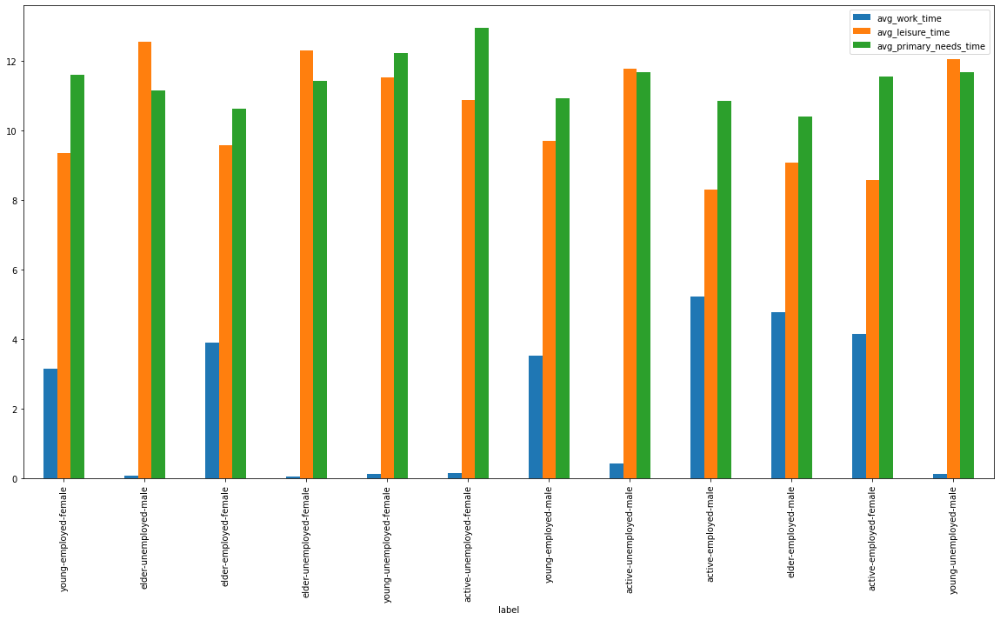

In [0]:
needs_matches = ['t01' , 't03' , 't11' , 't1801' , 't1803']
work_matches = ['t05' , 't1805']
other_matches = ['t02' , 't04' , 't06' , 't07' , 't08', 't09', 't10' , 't12' , 't13' , 't14' , 't15' , 't16' , 't18']
primary_needs_columns = [col for col in df.columns if any(x in col for x in needs_matches)]
work_columns = [col for col in df.columns if any(x in col for x in work_matches)]
other_activities_columns = [col for col in df.columns if any(x in col for x in other_matches)]
newDF = df.select(['tucaseid', 'telfs', 'teage', 'tesex']+primary_needs_columns+work_columns+other_activities_columns).withColumn('primary_needs_time',sum(df[col] for col in primary_needs_columns)).withColumn('work_time',sum(df[col] for col in work_columns)).withColumn('other_activities_time',sum(df[col] for col in other_activities_columns)).withColumn("labor_label", when(F.col("telfs") == 1, lit("employed")).when(F.col("telfs") == 2, lit("employed")).otherwise(lit("unemployed"))).withColumn("age_label", when(F.col("teage") <22, lit("young")).when(F.col("teage")>55, lit("elder")).otherwise(lit("active"))).withColumn("sex_label", when(F.col("tesex") == 1, lit("male")).otherwise(lit("female")))

label_DF = newDF.select(['age_label', 'labor_label', 'sex_label', 'primary_needs_time', 'work_time', 'other_activities_time']).groupBy('labor_label','sex_label','age_label').avg()
avg_hour_activies_DF = label_DF.withColumn("avg_primary_needs_time", (F.col("avg(primary_needs_time)") / 60)).withColumn("avg_work_time", (F.col("avg(work_time)") / 60)).withColumn("avg_leisure_time", (F.col("avg(other_activities_time)") / 60))
diagram_DF = avg_hour_activies_DF.select(concat(avg_hour_activies_DF.age_label,lit('-'),avg_hour_activies_DF.labor_label,lit('-'),avg_hour_activies_DF.sex_label).alias("label"),'avg_work_time', 'avg_leisure_time', 'avg_primary_needs_time')
diagram_DF.show()
pandasDF = diagram_DF.toPandas()
pandasDF.plot(x='label',figsize=(20,10),stacked=False,kind="bar")